In [3]:
# Standart libraries
import os

# Third-party libraries
import pandas as pd

# Local libraries
from utils import eda as eda

# Enable auto-reload for modules during development
%load_ext autoreload
%autoreload 2

In [4]:
# Data path
file_path = "../data"
file = os.path.join(file_path, 'uk_full_for_eda.csv')

In [5]:
# Reading the data
dataframe = pd.read_csv(file)


In [6]:
# Copy for better practices
df = dataframe.copy()
print("Size of the dataframe: ", df.shape)

Size of the dataframe:  (110263, 49)


In [7]:
df.head()

,settlement_date,settlement_period,nd,tsd,is_bank_holiday,gas,coal,nuclear,wind,wind_emb,...,direct_normal_irradiance_w/m²,diffuse_radiation_w/m²,year,day,month,day_of_week,season_Autumn,season_Spring,season_Summer,season_Winter
0,2019-01-01 00:00:00,1,23808,25291,1,5853.0,0.0,6924.0,9236.0,2031.0,...,0.0,0.0,2019,1,1,2,0,0,0,1
1,2019-01-01 00:30:00,2,24402,25720,1,6292.0,0.0,6838.0,9297.0,1997.0,...,0.0,0.0,2019,1,1,2,0,0,0,1
2,2019-01-01 01:00:00,3,24147,25495,1,5719.0,0.0,6834.0,9356.0,1959.0,...,0.0,0.0,2019,1,1,2,0,0,0,1
3,2019-01-01 01:30:00,4,23197,24590,1,5020.0,0.0,6830.0,9135.0,1914.0,...,0.0,0.0,2019,1,1,2,0,0,0,1
4,2019-01-01 02:00:00,5,22316,24346,1,4964.0,0.0,6827.0,8912.0,1865.0,...,0.0,0.0,2019,1,1,2,0,0,0,1


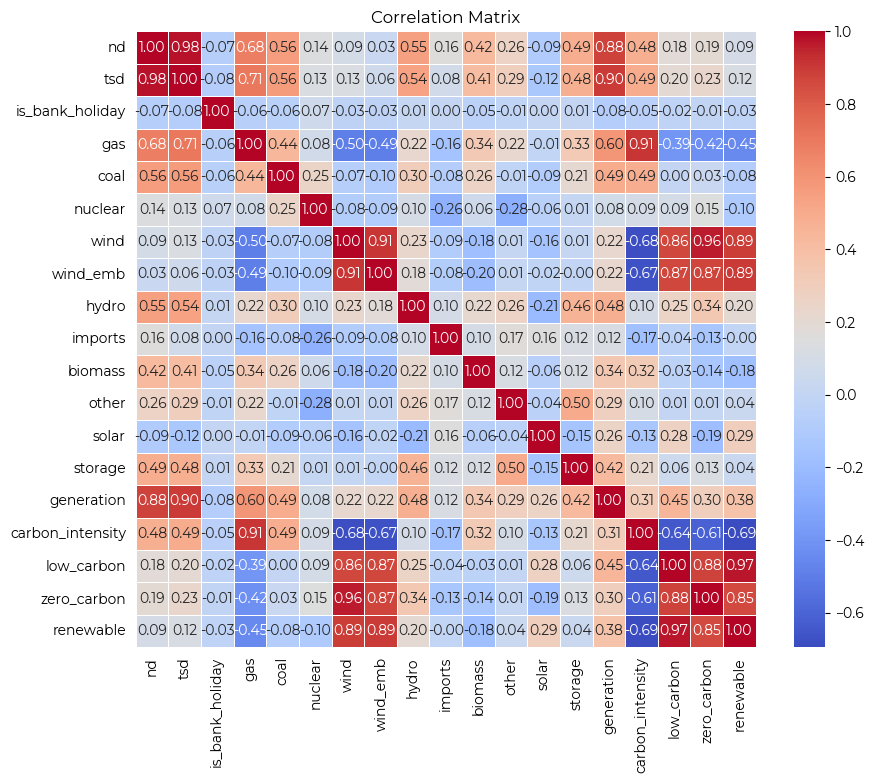

In [11]:
# Correlation

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
df_copy = df.copy()
df_copy = df_copy.drop('settlement_date', axis=1)
df_copy = df_copy.iloc[:, 1:20]
corr_matrix = df_copy.corr()

# Plotting the correlation matrix using seaborn
plt.figure(figsize=(10, 8))  # Set the size of the plot
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Display the plot
plt.title('Correlation Matrix')
plt.show()

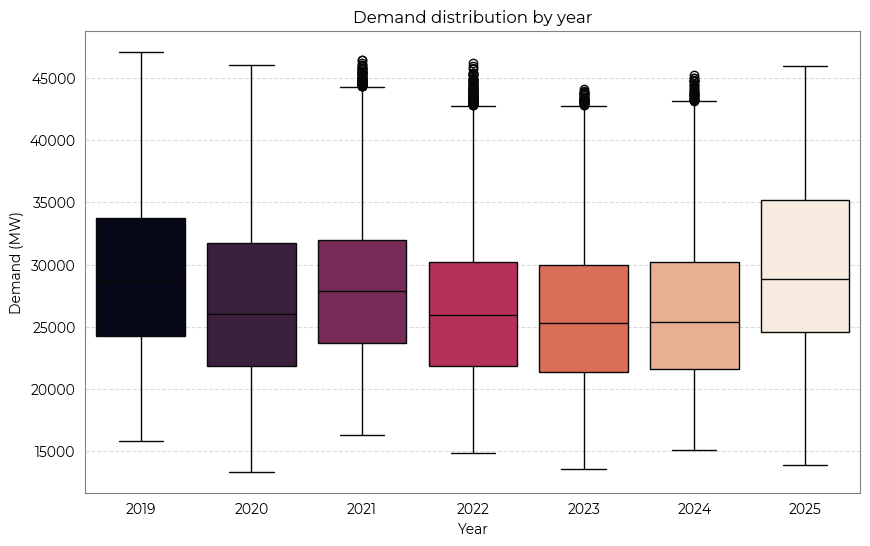

In [7]:
# Demand distribution by year
eda.plot_box_plots(df, "year", "nd", title="Demand distribution by year")

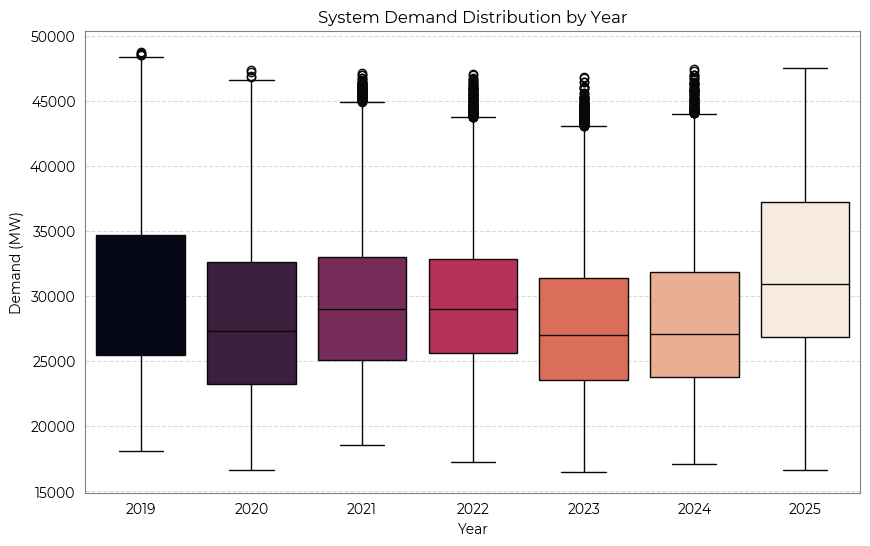

In [8]:
# System Demand distribution by year
eda.plot_box_plots(df,"year", "tsd", title = "System Demand Distribution by Year")

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

def box_plot(df, column):
    """
    Create a box plot for a given column in a DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column (str): The name of the column to plot.
    
    Returns:
    None
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
    plt.show()

In [6]:


data_path = os.path.join("..", "data")
models_path = os.path.join("..", "app/models")

import pickle

def load_models_and_data():
    # Load data
    df = pd.read_csv(os.path.join(data_path, "full_data_uk_scaled_with_target.csv"))
    df["settlement_date"] = pd.to_datetime(df["settlement_date"])

    # Load models
    with open(os.path.join(models_path, "model_30_min.pkl"), "rb") as f:
        models = pickle.load(f)

    return df, models

def generate_predictions(df, _models, target_cols):
    X = df.drop(columns=["settlement_date"] + target_cols)
    for model, target in zip(_models, target_cols):
        df[f"{target}_pred"] = model.predict(X)
    return df

In [7]:
# Loading data and models
df, models = load_models_and_data()

# Generate predictions
target_cols = ["nd", "solar", "wind", "carbon_intensity"]
df = generate_predictions(df, models, target_cols)

C:\Users\Arturo\AppData\Local\Temp\ipykernel_23520\536432166.py:13: UserWarning: [16:09:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\data\../common/error_msg.h:82: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  models = pickle.load(f)


In [11]:
target = "carbon_intensity"  
chart_df = df[["settlement_date", target, f"{target}_pred"]].copy()
chart_df.head()

,settlement_date,carbon_intensity,carbon_intensity_pred
0,2019-01-15 00:00:00,131.0,128.229584
1,2019-01-15 00:30:00,135.0,133.859604
2,2019-01-15 01:00:00,138.0,133.129623
3,2019-01-15 01:30:00,139.0,133.540955
4,2019-01-15 02:00:00,139.0,137.998444


In [16]:
import altair as alt
split_datetime = pd.to_datetime("2023-05-21 15:00:00") 

chart_df = df[["settlement_date", target, f"{target}_pred"]].copy()
chart_df["Set"] = chart_df["settlement_date"].apply(
                lambda x: "Test" if x >= split_datetime else "Train")

base = alt.Chart(chart_df).encode(x="settlement_date:T")

actual = base.mark_line(color="black").encode(
                y=alt.Y(target, title="Value"),
                tooltip=[        alt.Tooltip("settlement_date:T", title="Date"),
        alt.Tooltip(f"{target}:Q", title="Actual")]
            ).properties(title=f"{target} - Actual vs Prediction")

pred = base.mark_line().encode(
                y=alt.Y(f"{target}_pred", title="Value"),
                color=alt.Color("Set:N", scale=alt.Scale(domain=["Train", "Test"], range=["#1f77b4", "#ff7f0e"])),
                tooltip=[        alt.Tooltip("settlement_date:T", title="Date"),
        alt.Tooltip(f"{target}_pred:Q", title="Prediction"),
        alt.Tooltip("Set:N", title="Set")]
            )

In [21]:
chart_df.head()

,settlement_date,carbon_intensity,carbon_intensity_pred,Set
0,2019-01-15 00:00:00,131.0,128.229584,Train
1,2019-01-15 00:30:00,135.0,133.859604,Train
2,2019-01-15 01:00:00,138.0,133.129623,Train
3,2019-01-15 01:30:00,139.0,133.540955,Train
4,2019-01-15 02:00:00,139.0,137.998444,Train


In [18]:
alt.data_transformers.disable_max_rows()
# Just return or show the chart
(actual + pred).interactive()

alt.LayerChart(...)

In [19]:
one_week_df = chart_df[
                (chart_df["settlement_date"] >= split_datetime) &
                (chart_df["settlement_date"] < split_datetime + pd.Timedelta(days=7))
                ]

base = alt.Chart(one_week_df).encode(x="settlement_date:T")

actual = base.mark_line(color="black").encode(
                y=alt.Y(target, title="Value"),
                tooltip=["settlement_date", target]
        ).properties(title=f"{target} - One Week View")

pred = base.mark_line().encode(
                y=alt.Y(f"{target}_pred", title="Value"),
                color=alt.Color("Set:N", scale=alt.Scale(domain=["Train", "Test"], range=["#1f77b4", "#ff7f0e"])),
                tooltip=["settlement_date", f"{target}_pred", "Set"]
            )

In [20]:
(actual + pred).interactive()

alt.LayerChart(...)